# 2025.1114

This notebook visualizes MCM-2024 magnetomap for SGEPSS 2025.

CAUTION: This notebook requires a different virtual environment, as described in the [IAGA tutorial](https://github.com/IAGA-VMOD/IGRF14eval/blob/main/README.md#local-development):


In [1]:
# Import the packages and bespoke functions from src folder
import os
import sys
import glob

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
sys.path.append('..')

import shapefile  # from package pyshp >= 2.3.1, pip install pyshp
shp = os.path.abspath('./external/ne_110m_coastline.zip')

from src import sha_lib as shal
from src import shc_utils as shau

# Set up line colour/type/marker properties using cycler
from cycler import cycler
cc = ( cycler(linestyle=['-', '--', '-.',':']) *
       cycler(color=list('rgbk')) *
       cycler(marker=['none', 's', '.']))


import pandas     as pd   # Pandas 2.0.3

from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LogNorm

np.set_printoptions(precision=5, floatmode='fixed', suppress=True)
pd.options.display.float_format = '{:.5f}'.format

%matplotlib inline
# print(plt.rcParams.keys())
plt.rcParams.update({
    'font.size'     : 16,
    'axes.grid'     : True,
    'grid.linestyle': '--',
    'lines.linewidth': 2,
})

print(f"    Python {sys.version}")
print(f"     Numpy {np.__version__}")
print(f"    Pandas {pd.__version__}")
print(f"Matplotlib {mpl.__version__}")

    Python 3.11.13 | packaged by conda-forge | (main, Jun  4 2025, 14:52:34) [Clang 18.1.8 ]
     Numpy 1.26.4
    Pandas 2.1.4
Matplotlib 3.7.3


In [2]:
### Configuration

dt = 0.25 # Time step
J = 195 # Number of Gauss coefficients up to degree n=13
d_max = 2 # Order of the derivative

# font size
f_large  = 20
f_medium = 16
f_small  = 12
f_tiny   = 10

s = 1 # Scale factor for the uncertainty plot (\pm s * sigma)

In [3]:
def get_std_df(P, time):
    # P[:, :, t] = Covariance Matrix at time t
    if len(time) != P.shape[2]:
        raise ValueError(f"The length of time ({len(time)}) must be the same as the 3rd dimension of Cvar Matrix ({P.shape[2]}). Ensure P[:, :, t] = Covariance Matrix at time t")

    std = np.array([ np.sqrt(np.diag(P[:, :, i])) for i in range(len(time))])
    df = pd.DataFrame(std, columns=[f"std_{i}" for i in range(std.shape[1])], index=time)
    return df

In [4]:
### plot gauss coefficients time series
def plot_coef(figlocs, target_l,
              coef_df, coef_train, stdd_train, 
              coef_RNN, stdd_RNN, 
              time, time_memo, idx_tS, idx_tE, idx_fS, idx_fE, 
              target_color):

    fig = plt.figure(figsize=(15,12))
    fig.subplots_adjust(wspace=0.3, hspace=0.3)
    axes = [plt.subplot(figloc) for figloc in figlocs]
    
    for l, ax in zip(target_l, axes):
        ax.plot(time[idx_tS:idx_fE+1], coef_df.values.T[l, :], 
                color='black', linewidth=2.0, 
                label='MCM 2024')
        
        ax.plot(time[idx_tS:idx_tE+1], coef_train[l, :], 
                color='C0',  linewidth=2.0, 
                label=f'Training Data $(\pm {s} \sigma)$')
        ax.fill_between(time[idx_tS:idx_tE+1], 
                coef_train[l, :] - s*stdd_train[l, :], 
                coef_train[l, :] + s*stdd_train[l, :], 
                color='gray', alpha=0.5)

        ymin, ymax = ax.get_ylim()
        ax.fill_between(time[idx_fS:idx_fE+1], 
                        ymin, 
                        ymax, 
                        color=target_color, alpha=0.5) # colorize forecast target period

        ax.set_ylim(ymin, ymax)
    return fig, axes

# Load MCM model


In [5]:
load_src = "../data/processed/"

In [6]:
d0g_raw = pd.read_csv(f"{load_src}/coef_g.csv")  .iloc[:, :J+1]
d1g_raw = pd.read_csv(f"{load_src}/coef_d1g.csv").iloc[:, :J+1]
d2g_raw = pd.read_csv(f"{load_src}/coef_d2g.csv").iloc[:, :J+1]

d0g_raw.set_index('YEAR', inplace=True)
d1g_raw.set_index('YEAR', inplace=True)
d2g_raw.set_index('YEAR', inplace=True)

d0R_raw = np.load(f"{load_src}/cvar_R.npy")  [:J+1, :J+1, :]
d1R_raw = np.load(f"{load_src}/cvar_d1R.npy")[:J+1, :J+1, :]
d2R_raw = np.load(f"{load_src}/cvar_d2R.npy")[:J+1, :J+1, :]

display(d2g_raw.head())
print(d2R_raw[0:5,0:5, 0])
print(d2R_raw[0:5,0:5, 1])
print(d2R_raw[0:5,0:5, 2])
print(d2R_raw[0:5,0:5, 3])
print(d2R_raw[0:5,0:5, -1])

,"g(1,0)","g(1,1)","h(1,1)","g(2,0)","g(2,1)","h(2,1)","g(2,2)","h(2,2)","g(3,0)","g(3,1)",...,"g(13,9)","h(13,9)","g(13,10)","h(13,10)","g(13,11)","h(13,11)","g(13,12)","h(13,12)","g(13,13)","h(13,13)"
YEAR,,,,,,,,,,,,,,,,,,,,,
2004.87390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.12370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.37390,-1.30880,2.22560,-0.89280,-0.17440,-0.08800,-0.74240,1.53120,0.15680,-0.06880,0.20320,...,-0.00160,0.00160,0.00160,-0.00160,0.00160,0.00000,0.00160,0.00320,-0.00160,0.00000
2005.62410,-0.00000,1.10080,-0.70560,0.47520,-0.55680,-0.27360,1.43360,0.30720,-0.10240,-0.53280,...,0.00000,0.00160,0.00000,-0.00160,0.00320,-0.00160,0.00000,-0.00160,-0.00480,0.00000
2005.87420,-0.78560,1.80640,-1.30880,0.81440,-0.77440,-0.56000,2.16160,1.32000,0.09280,0.14880,...,-0.00160,0.00160,0.00000,-0.00320,-0.00000,0.00000,0.00320,0.00320,-0.00320,0.00160


[[2004.87400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.12400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.37400        nan        nan        nan        nan]
 [       nan   36.30865   -0.34635   -0.11209    1.66008]
 [       nan   -0.34635   20.52914   -0.11124   -0.04573]
 [       nan   -0.11209   -0.11124   25.27605    0.14777]
 [       nan    1.66008   -0.04573    0.14777   18.48007]]
[[2005.62400        nan        nan        nan        nan]
 [       nan   36.29873   -0.34612   -0.11215    1.66007]
 [       na

In [7]:
columns     = d0g_raw.columns
time_raw    = d0g_raw.index.values

coef_raw    = [d0g_raw.iloc[:, :J], d1g_raw.iloc[:, :J], d2g_raw.iloc[:, :J]]
Rmatrix_raw = [d0R_raw[:J+1, :J+1, :], d1R_raw[:J+1, :J+1, :], d2R_raw[:J+1, :J+1, :]]

print(time_raw)
print(d0R_raw[0, 0, :])

[2004.87390 2005.12370 2005.37390 2005.62410 2005.87420 2006.12440
 2006.37460 2006.62470 2006.87490 2007.12510 2007.37530 2007.62540
 2007.87560 2008.12540 2008.37490 2008.62440 2008.87390 2009.12370
 2009.37390 2009.62410 2009.87420 2010.12440 2010.37460 2010.62470
 2010.87490 2011.12510 2011.37530 2011.62540 2011.87560 2012.12540
 2012.37490 2012.62440 2012.87390 2013.12370 2013.37390 2013.62410
 2013.87420 2014.12440 2014.37460 2014.62470 2014.87490 2015.12510
 2015.37530 2015.62540 2015.87560 2016.12540 2016.37490 2016.62440
 2016.87390 2017.12370 2017.37390 2017.62410 2017.87420 2018.12440
 2018.37460 2018.62470 2018.87490 2019.12510 2019.37530 2019.62540
 2019.87560 2020.12540 2020.37490 2020.62440 2020.87390 2021.12370
 2021.37390 2021.62410 2021.87420 2022.12440 2022.37460 2022.62470
 2022.87490 2023.12510 2023.37530 2023.62540 2023.87560 2024.12540
 2024.37490 2024.62440 2024.87390 2025.12370 2025.37390 2025.62410
 2025.87420 2026.12440 2026.37460 2026.62470 2026.87490 2027.1

In [8]:
m_tS = 2004.8739 # Training Start
m_idx_tS = np.where(time_raw == m_tS)[0][0]

tS, tE, fS, fE = 2004.8739, 2018.6247, 2018.8749, 2023.6254
xticks = np.arange(2005, 2025, 5)

idx_tS = np.where(time_raw == tS)[0][0]
idx_tE = np.where(time_raw == tE)[0][0]
idx_fS = np.where(time_raw == fS)[0][0]
idx_fE = np.where(time_raw == fE)[0][0]

L_hind = idx_tE - m_idx_tS + 1 # Number of training data
M_hind = idx_fE -   idx_fS + 1 # Number of validation data
N_hind = idx_fE - m_idx_tS + 1 # Number of all data (training + forecast)

print(f"training size: L={L_hind}, validation size: M={M_hind}, all data size: N={N_hind}")

print(f"idx_tS={idx_tS:2d}, tS = {tS} = {time_raw[idx_tS]}")
print(f"idx_tE={idx_tE:2d}, tE = {tE} = {time_raw[idx_tE]}")
print(f"idx_fS={idx_fS:2d}, fS = {fS} = {time_raw[idx_fS]}")
print(f"idx_fE={idx_fE:2d}, fE = {fE} = {time_raw[idx_fE]}")

training size: L=56, validation size: M=20, all data size: N=76
idx_tS= 0, tS = 2004.8739 = 2004.8739
idx_tE=55, tE = 2018.6247 = 2018.6247
idx_fS=56, fS = 2018.8749 = 2018.8749
idx_fE=75, fE = 2023.6254 = 2023.6254


In [9]:
ref_df       = [coef_raw[d].loc[m_tS:fE] for d in range(d_max + 1)]
ref_train_df = [ref_df[d]  .loc[m_tS:tE] for d in range(d_max + 1)]
ref_train    = [ref_train_df[d].values.T for d in range(d_max + 1)]

Rmatrix_train = [Rmatrix_raw[d][:, :,                             m_idx_tS:idx_tE + 1]  for d in range(d_max + 1)]
stdd_train_df = [get_std_df(Rmatrix_train[d][1:, 1:, :], time_raw[m_idx_tS:idx_tE + 1]) for d in range(d_max + 1)]
stdd_train    = [stdd_train_df[d].values.T                                              for d in range(d_max + 1)]


In [10]:
figlocs  = [221, 222, 223, 224]
target_l = [0, 14, 24, 78] # [g(1, 0), h(3, 3), g(5, 0), g(8, 8)]
target_l = [0, 14, 0, 78] # [g(1, 0), h(3, 3), g(5, 0), g(8, 8)]
unit = [" Core field [nT]", " SV [nT/yr]", " SA [nT/yr$^2$]"]

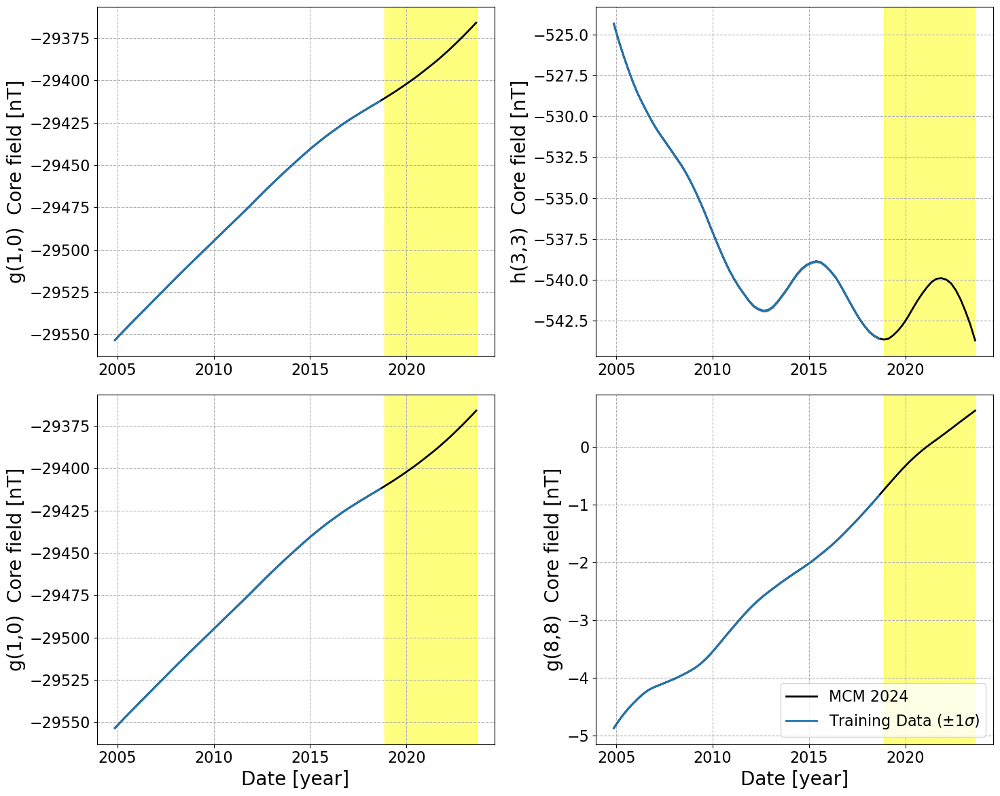

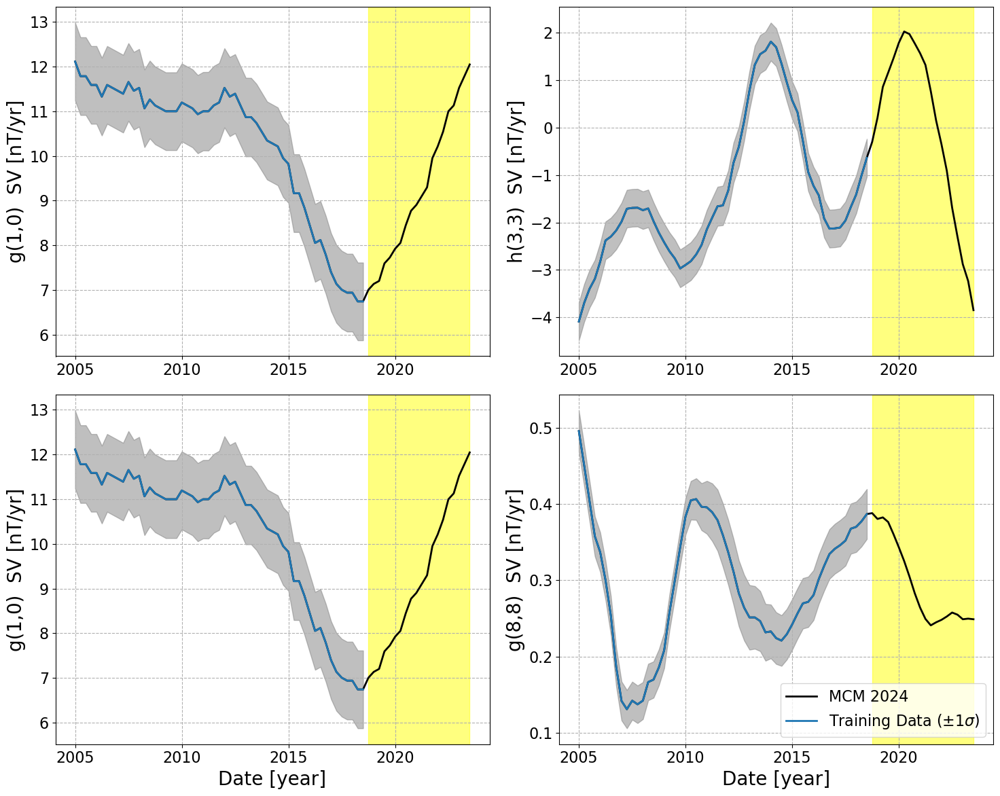

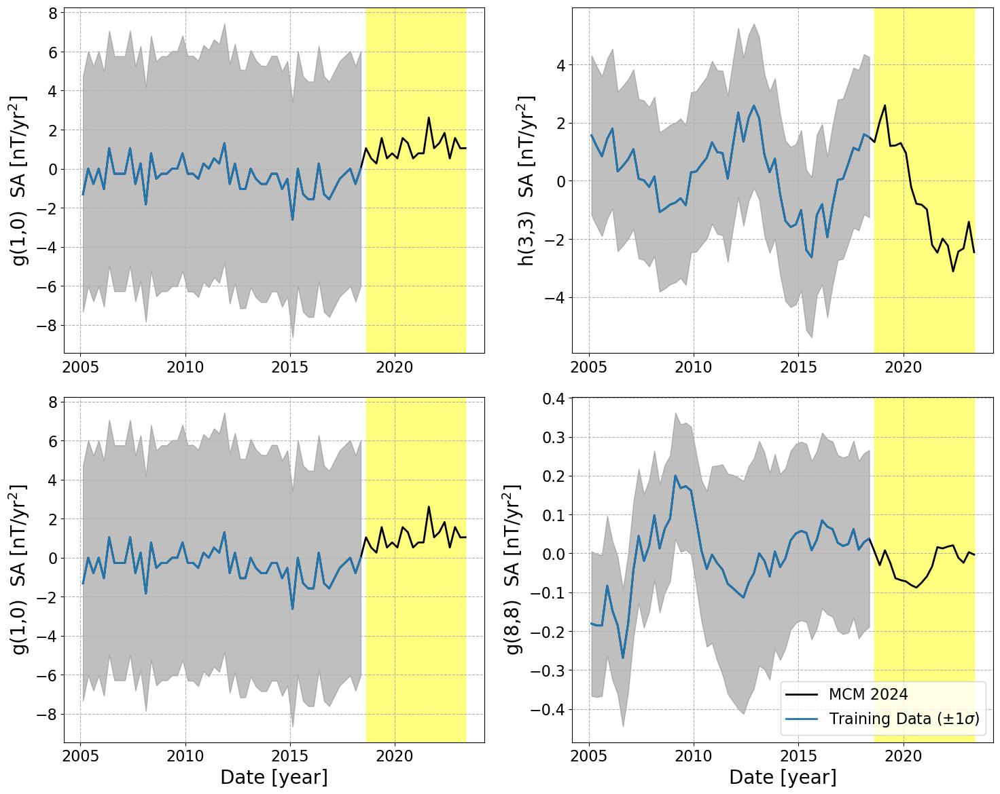

In [11]:
for d in range(d_max + 1):
    if   d == 2:
        time_ref = time_raw - 0.250 # leap frog
    elif d == 1:
        time_ref = time_raw - 0.125 # leap frog
    elif d == 0:
        time_ref = time_raw
    
    fig, axes = plot_coef(figlocs, target_l,
                          ref_df[d], ref_train[d], stdd_train[d], 
                          np.nan * ref_df[d], np.nan * ref_df[d], 
                          time_ref, time_ref, m_idx_tS, idx_tE, idx_fS, idx_fE, 
                          target_color="yellow")
    
    handles, labels = axes[0].get_legend_handles_labels()
    axes[3].legend(handles[:2], labels[:2], loc="lower right", fontsize=f_medium)

    for l, ax in zip(target_l, axes):
        ax.set_ylabel(f"{columns[l]} {unit[d]}", fontsize=f_large)
        ax.set_xticks(xticks)

    for ax in axes[2:]:
        ax.set_xlabel("Date [year]", fontsize=f_large)

    plt.tight_layout()
    plt.show()


## Br map export

In [12]:
print(time_ref)
print(time_ref[44])

[2004.62390 2004.87370 2005.12390 2005.37410 2005.62420 2005.87440
 2006.12460 2006.37470 2006.62490 2006.87510 2007.12530 2007.37540
 2007.62560 2007.87540 2008.12490 2008.37440 2008.62390 2008.87370
 2009.12390 2009.37410 2009.62420 2009.87440 2010.12460 2010.37470
 2010.62490 2010.87510 2011.12530 2011.37540 2011.62560 2011.87540
 2012.12490 2012.37440 2012.62390 2012.87370 2013.12390 2013.37410
 2013.62420 2013.87440 2014.12460 2014.37470 2014.62490 2014.87510
 2015.12530 2015.37540 2015.62560 2015.87540 2016.12490 2016.37440
 2016.62390 2016.87370 2017.12390 2017.37410 2017.62420 2017.87440
 2018.12460 2018.37470 2018.62490 2018.87510 2019.12530 2019.37540
 2019.62560 2019.87540 2020.12490 2020.37440 2020.62390 2020.87370
 2021.12390 2021.37410 2021.62420 2021.87440 2022.12460 2022.37470
 2022.62490 2022.87510 2023.12530 2023.37540 2023.62560 2023.87540
 2024.12490 2024.37440 2024.62390 2024.87370 2025.12390 2025.37410
 2025.62420 2025.87440 2026.12460 2026.37470 2026.62490 2026.8

In [13]:
field = ("0_CF", "1_SV", "2_SA")

for idx_t in [42, 43, 44, 45, 46]:
    for d in range(3):
        time = time_raw[idx_t] - 0.1251 * d
        print(f"idx_t={idx_t:2d}, time = {time:.2f}")

        d2g = ref_train[d][:, idx_t]
        d2R = stdd_train[d][:, idx_t]
        columns = columns

        gSA_df = pd.DataFrame(d2g, index=columns)
        dSA_df = pd.DataFrame(np.sqrt(d2R), index=columns)

        ### generate submit file.mod
        w_lines = [
            f"# FOR PLOT\n", 
            f"# {field[d]} field snapshot\n", 
            f"# n m gnm hnm uncertainty_gnm uncertainty_hnm\n"
        ]
        print("".join(w_lines))

        for n in range(1, 14):
            for m in range(0, n+1):
                w_line = f"{n:2d} {m:2d} "

                if m == 0: # g(n,0) only
                    gnm = gSA_df.loc[f"g({n},{m})"].values[0]
                    uncertainty_gnm = dSA_df.loc[f"g({n},{m})"].values[0]
                    w_line = w_line + f"{gnm:10.2f} {0.0:10.2f} {uncertainty_gnm:5.2f} {0.0:5.2f}"
                else: # g(n,m) and h(n,m)
                    gnm = gSA_df.loc[f"g({n},{m})"].values[0]
                    hnm = gSA_df.loc[f"h({n},{m})"].values[0]
                    uncertainty_gnm = dSA_df.loc[f"g({n},{m})"].values[0]
                    uncertainty_hnm = dSA_df.loc[f"h({n},{m})"].values[0]
                    w_line = w_line + f"{gnm:10.2f} {hnm:10.2f} {uncertainty_gnm:5.2f} {uncertainty_hnm:5.2f}"

                print(w_line)
                w_lines.append(w_line + "\n")

        f = open(f"./MCM_cofs/{field[d]}_MCM_{time:.2f}.cof", "w", encoding="ascii")
        f.writelines(w_lines)
        f.close()


idx_t=42, time = 2015.38
# FOR PLOT
# 0_CF field snapshot
# n m gnm hnm uncertainty_gnm uncertainty_hnm

 1  0  -29437.16       0.00  0.39  0.00
 1  1   -1495.94    4785.09  0.34  0.36
 2  0   -2450.13       0.00  0.33  0.00
 2  1    3010.65   -2855.95  0.27  0.26
 2  2    1677.07    -647.98  0.28  0.29
 3  0    1351.79       0.00  0.24  0.00
 3  1   -2354.13    -112.09  0.23  0.25
 3  2    1225.97     244.97  0.22  0.21
 3  3     577.66    -538.86  0.25  0.27
 4  0     907.09       0.00  0.20  0.00
 4  1     813.65     283.35  0.16  0.21
 4  2     117.19    -186.39  0.16  0.16
 4  3    -333.21     182.30  0.16  0.16
 4  4      68.77    -330.75  0.17  0.21
 5  0    -232.93       0.00  0.18  0.00
 5  1     360.53      47.07  0.12  0.13
 5  2     191.88     197.64  0.12  0.12
 5  3    -140.95    -119.51  0.12  0.12
 5  4    -156.88      17.23  0.13  0.13
 5  5       5.79     100.02  0.13  0.13
 6  0      69.22       0.00  0.10  0.00
 6  1      67.52     -20.56  0.10  0.10
 6  2      72.6

## Configure input

User sets the following variables:

In [14]:
# Access candidate models in the ../data/IGRF13/DGRF directory
# Declare the fixed constants
field_type = 'main'   # 'main' or 'sv'
candidate = 'SV'    # 'DGRF', 'IGRF' or 'SV'
year = '2025'         # For labelling

IGRFSV_DIR = os.path.abspath('./MCM_cofs/*.cof')

In [15]:
"""

Check files are correctly formatted

"""
print('List of ' + candidate + ' Candidates \n ----------- ')
files = sorted(glob.glob(IGRFSV_DIR))
print(*files, sep='\n')

pass_or_fail = shau.check_cof_file_format(files, field_type)

if not(pass_or_fail).all():
    raise Exception('A candidate model format is incorrect. Fix it before \
                    continuing')

# Load in the coefficients - define the type (main or sv) and the leading
# acronym on the filename
[coeffs, institute_name, degree] = \
         shau.load_coeffs_to_numpy(sorted(files), field_type, candidate)
num_candidates = coeffs.shape[1]

List of SV Candidates 
 ----------- 
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2015.13.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2015.38.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2015.63.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2015.88.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2016.12.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2016.13.cof
/Users/satosho/Library/CloudStorage/OneDrive-KyotoUniversity/relay_lab_pc/EKF-RNN_B_LOD_LDT/visualization/MCM_cofs/0_CF_MCM_2016.37.cof
/Users/sato

0_CF_MCM_2015.13
contains np.nan?  False
plot done


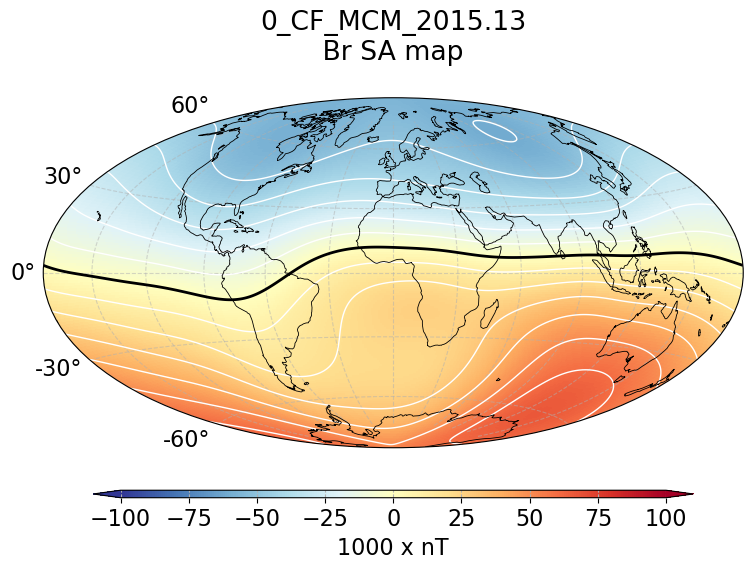

0_CF_MCM_2015.38
contains np.nan?  False
plot done


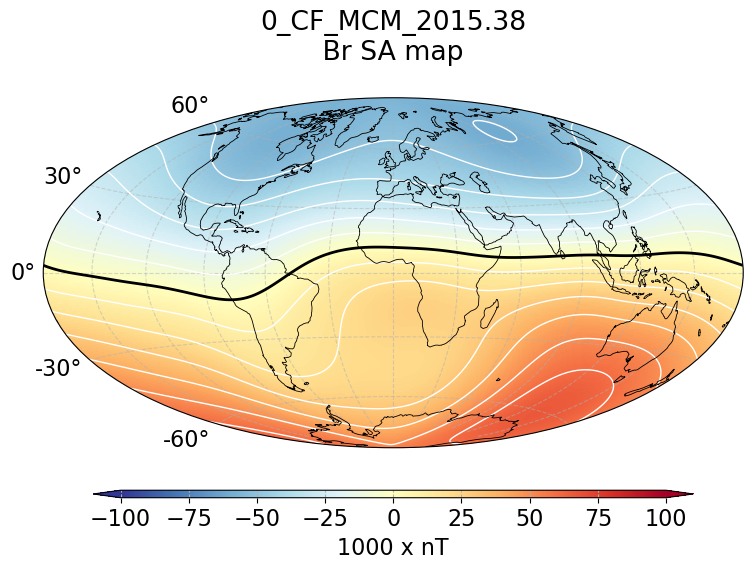

0_CF_MCM_2015.63
contains np.nan?  False
plot done


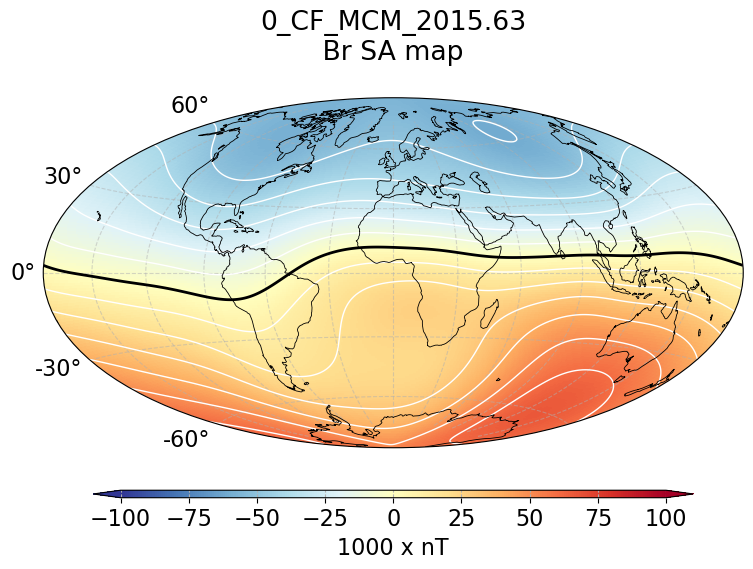

0_CF_MCM_2015.88
contains np.nan?  False
plot done


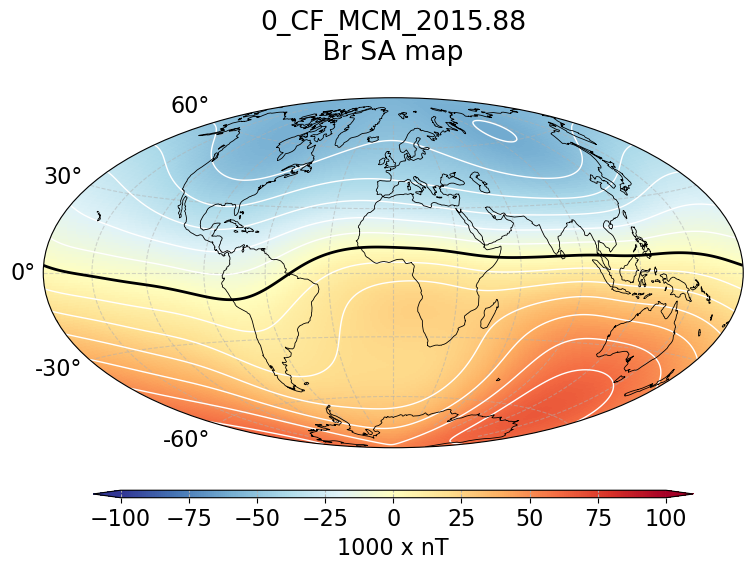

0_CF_MCM_2016.12
contains np.nan?  False
plot done


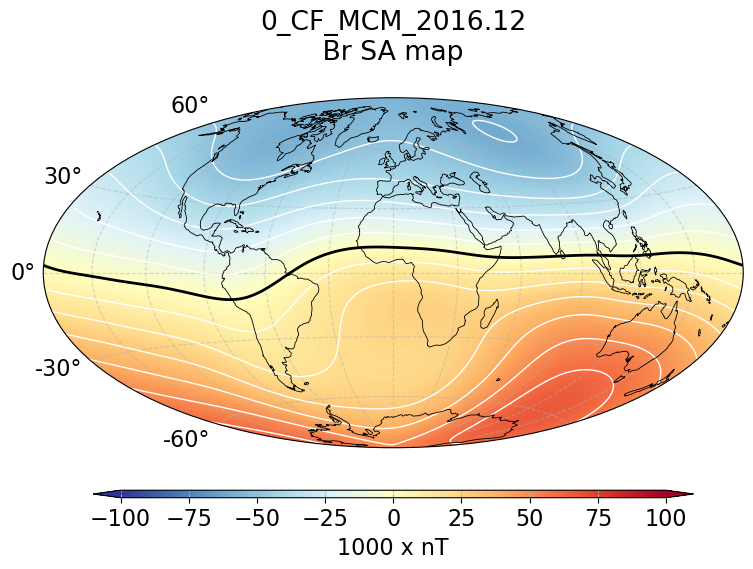

0_CF_MCM_2016.13
contains np.nan?  False
plot done


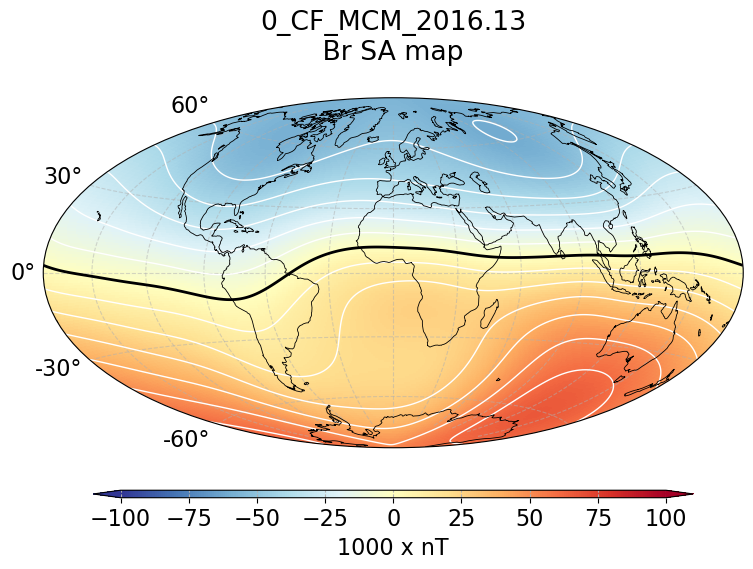

0_CF_MCM_2016.37
contains np.nan?  False
plot done


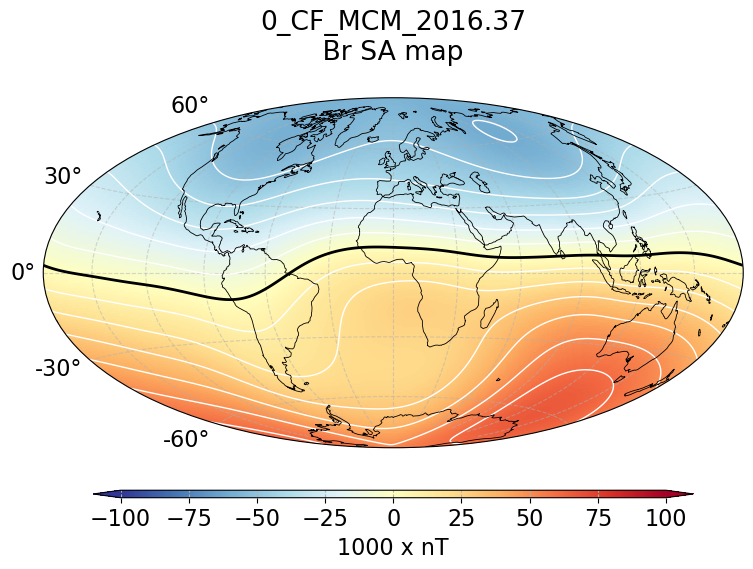

1_MCM_2015.00
contains np.nan?  False
plot done


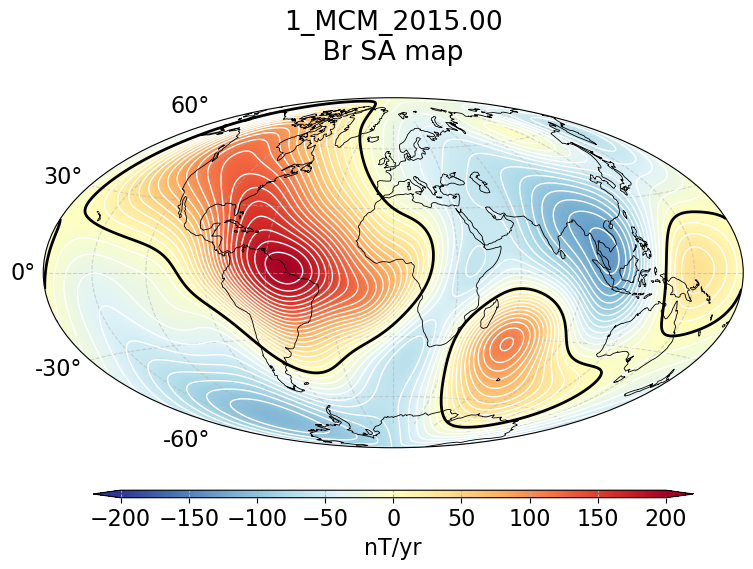

1_MCM_2015.25
contains np.nan?  False
plot done


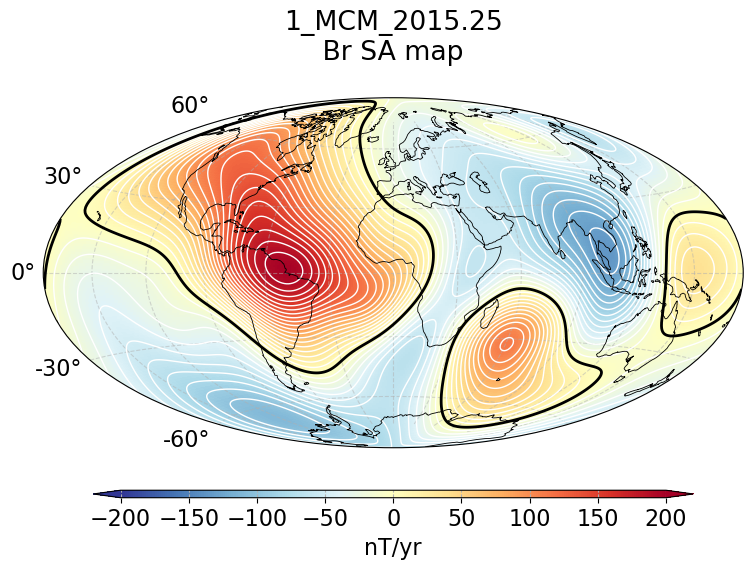

1_MCM_2015.50
contains np.nan?  False
plot done


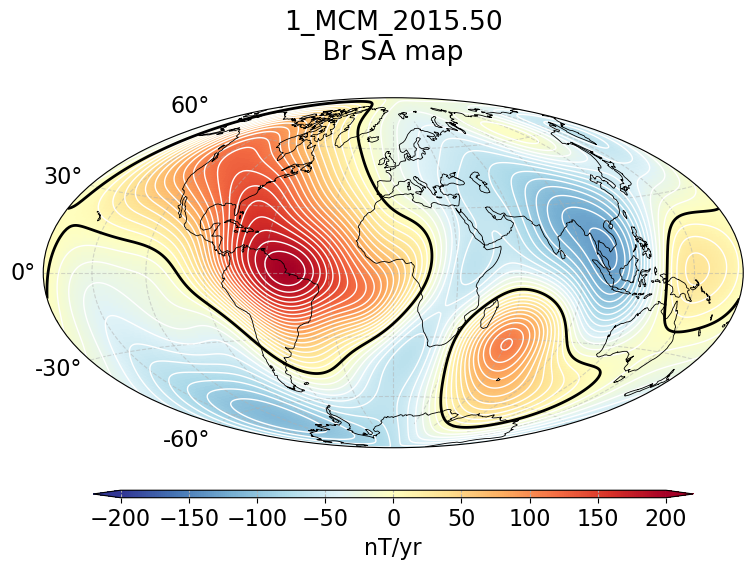

1_MCM_2015.75
contains np.nan?  False
plot done


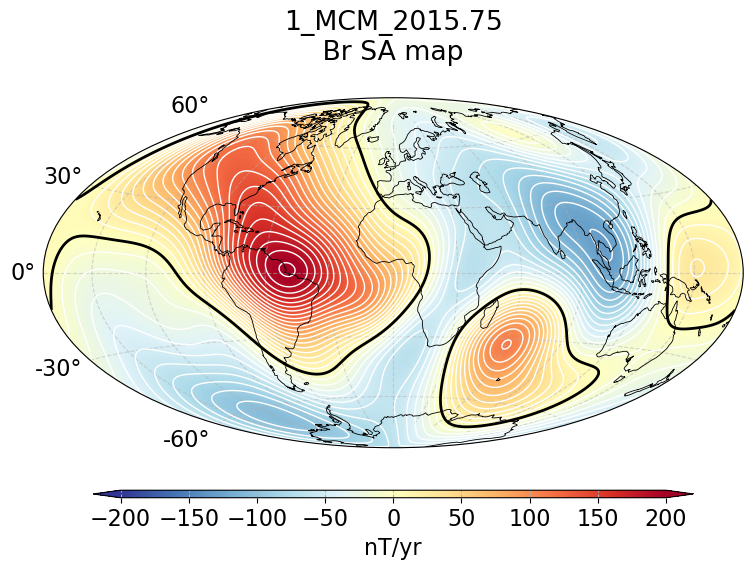

1_MCM_2016.00
contains np.nan?  False
plot done


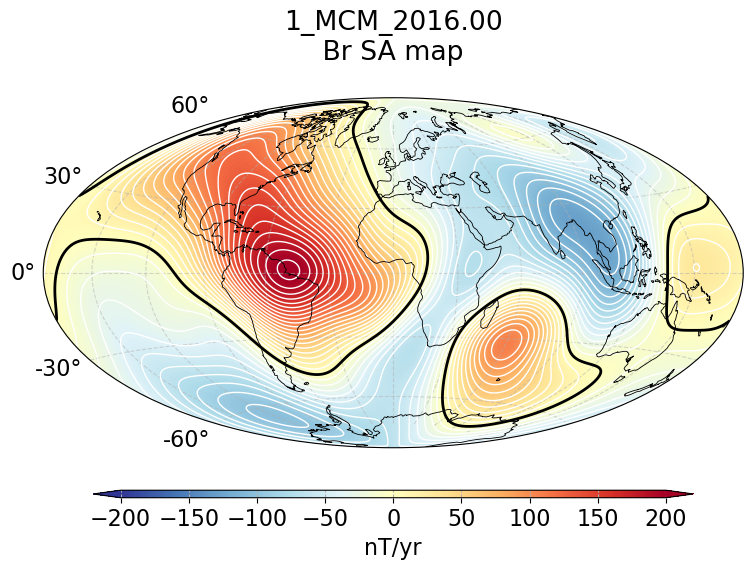

1_MCM_2016.25
contains np.nan?  False
plot done


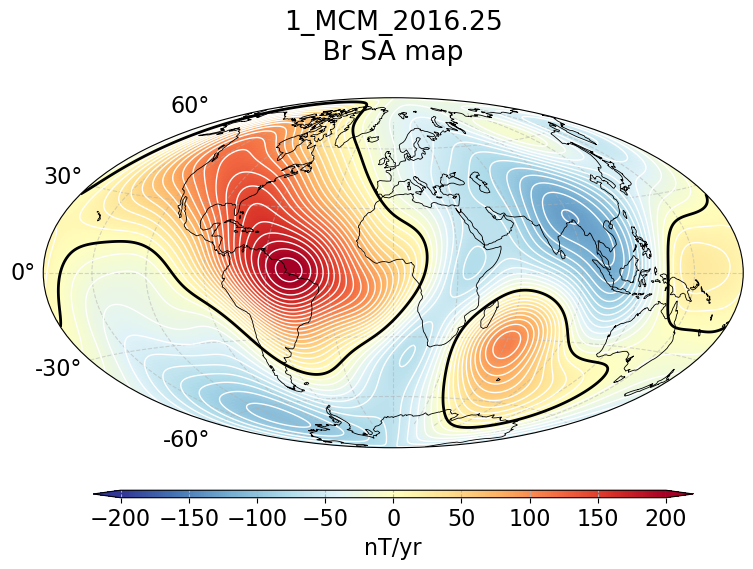

2_SA_MCM_2014.88
contains np.nan?  False
plot done


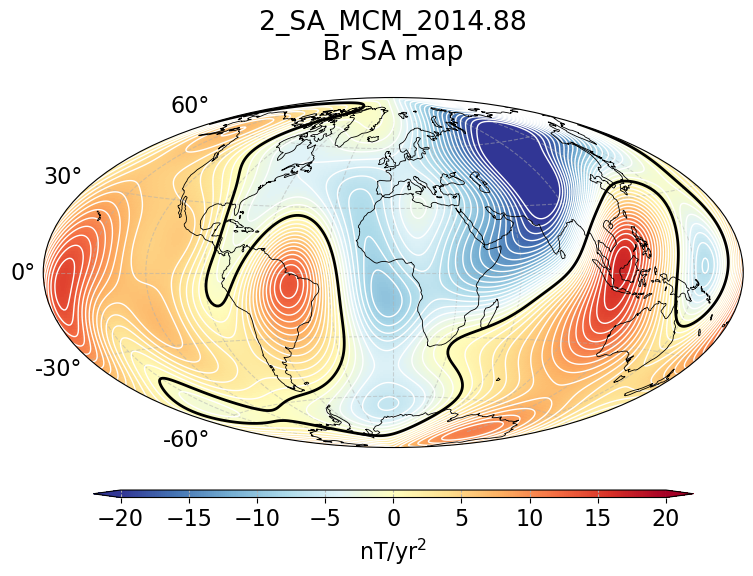

2_SA_MCM_2015.13
contains np.nan?  False
plot done


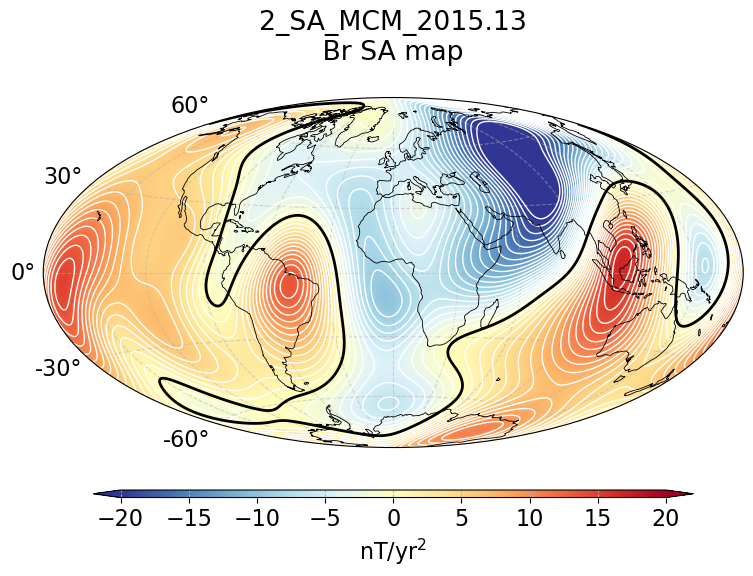

2_SA_MCM_2015.38
contains np.nan?  False
plot done


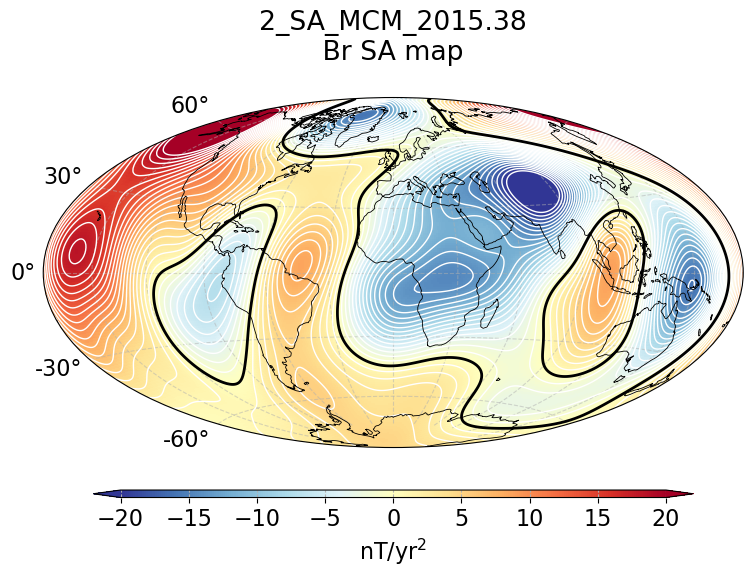

2_SA_MCM_2015.63
contains np.nan?  False
plot done


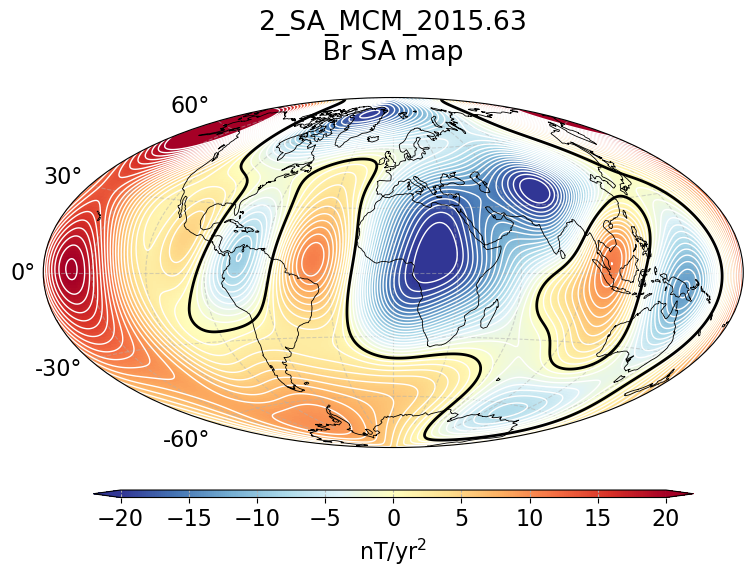

2_SA_MCM_2015.87
contains np.nan?  False
plot done


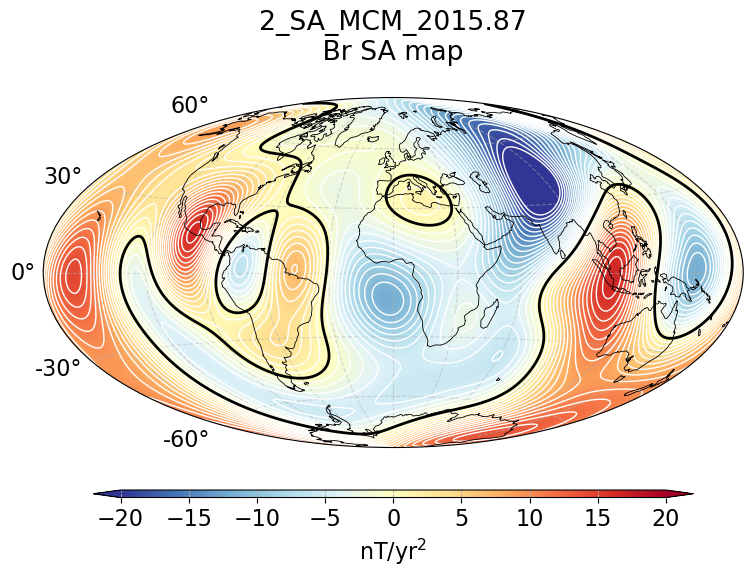

2_SA_MCM_2015.88
contains np.nan?  False
plot done


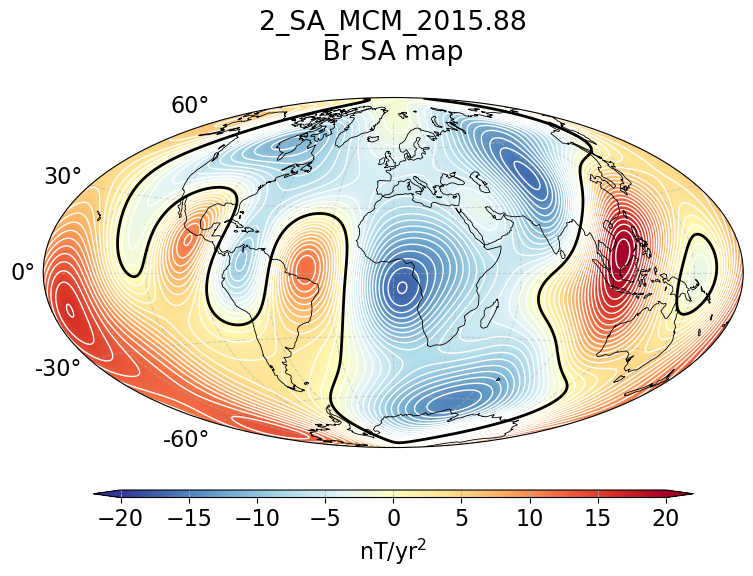

2_SA_MCM_2016.12
contains np.nan?  False
plot done


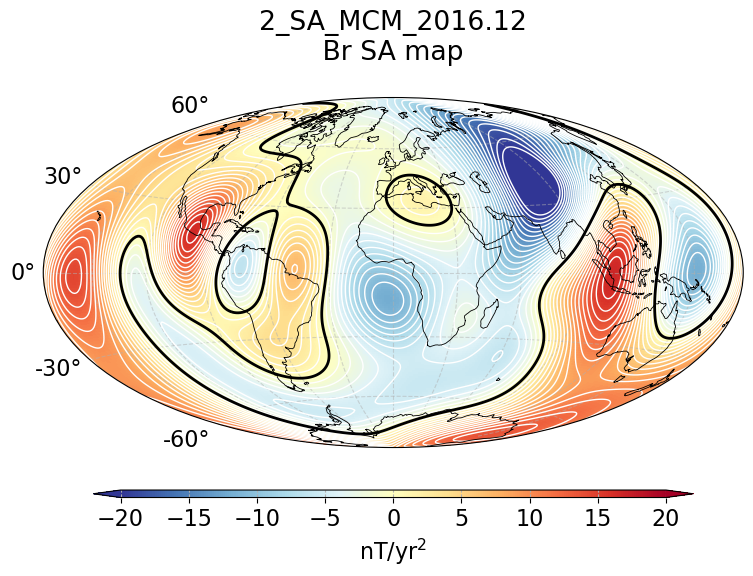

In [16]:
"""

Sixth Test: Plot a series of small maps showing the main field or SV
differences in a chosen component (default 'Z') against the other candidates

Can take several minutes depending on the machine speed

Based on the example from
https://kpegion.github.io/Pangeo-at-AOES/examples/multi-panel-cartopy.html


"""

component = 'Br'    # Choose X, Y or Z, Br, Bt, Bp


# Define the contour levels to use in plt.contourf
min_max = 20 #nT
contour = 1 # nT
clevs=np.arange(-min_max,min_max+1,contour)


# Set up a lat/long grid  every 5 degrees
max_lon = 180
max_lat = 90
num_lon = int(2 * max_lon) + 1
num_lat = int(2 * max_lat) + 1
longs  = np.linspace(-max_lon, max_lon, num_lon)
lats   = np.linspace(-max_lat, max_lat, num_lat)
RREF = 6371.2 # standard geomagnetic Earth radius (in km)

s = 1
unit = 0

# PLOT --------------------------------------------------------------
# Use an axis counter to ensure no gaps in the middle subplots
#Loop over all of the models
for j in range(num_candidates):
    field = int(institute_name[j][0])

    if field == 0: # MAIN FIELD
        s = 1000
        min_max = 100 #nT
        contour = 10 # nT
        unit = f"{s} x nT"
    elif field == 1: # SV
        s = 1
        min_max = 200 #nT
        contour = 10 # nT
        unit = "nT/yr"
    elif field == 2: # SA
        s = 1
        min_max = 20 #nT
        contour = 1 # nT
        unit = r'nT/yr$^2$'
    clevs=np.arange(-min_max,min_max+1,contour)

    # Define the figure and each axis for the 3 rows and 3 columns
    fig, axes = plt.subplots(subplot_kw={'projection': 'hammer'},
                            figsize=(10,5), squeeze=False)

    ax = axes[0,0]
    # Compute the Gauss coefficient differences
    # skip the pos[0] model (or it will be empty)

    print(institute_name[j])
    # D. Kerridge's code includes the monopole for SHA computation
    gh = np.append(0., coeffs[:,j])

    # Compute the maps of differences and save to a dict for ease
    # of plotting an individual element
    Bx, By, Bz = zip(*[shal.shm_calculator(gh,degree,RREF, \
                                            90-lat,lon, \
                                            'Geocentric') \
                        for lat in lats for lon in longs])
    X = np.asarray(Bx).reshape(num_lat,num_lon) / s
    Y = np.asarray(By).reshape(num_lat,num_lon) / s
    Z = np.asarray(Bz).reshape(num_lat,num_lon) / s
    elements={'X':X, 'Y':Y, 'Z':Z, 'Br':-Z, 'Bt':-X, 'Bp':Y}

    # Filled colour plot
    cs=ax.pcolormesh(np.radians(longs), np.radians(lats),
                        elements[component],
                        cmap='RdYlBu_r',
                        vmin=clevs.min(),
                        vmax=clevs.max()
                    )

    print("contains np.nan? ", np.isnan(elements[component]).any())

    # cs = ax.contourf(np.radians(longs), np.radians(lats),
    #                  elements[component],
    #                  levels=clevs,
    #                  cmap='RdYlBu_r', extend='both') # works weirdly

    for lev in clevs:
        line_c = ax.contour(np.radians(longs), np.radians(lats),
                            elements[component],
                            levels=[lev], alpha=1.0,
                            colors=['white'], linewidths=1,
                            negative_linestyles='solid')

    # Add the zero contours
    line_c = ax.contour(np.radians(longs), np.radians(lats),
                        elements[component],
                        levels=[0], alpha=1.0,
                        colors=['black'], linewidths=2.0, 
                        linestyles='solid')
    print("plot done")

    # FORMAT --------------------------------------------------------------
    # Title each subplot with the name of the model
    ax.set_title(institute_name[j] + f"\n {component} SA map \n")

    # Draw the coastines for each subplot
    # read shape-file and plot coast lines
    with shapefile.Reader(shp) as sf:

        for rec in sf.shapeRecords():
            lon_coast = np.radians([point[0] for point in rec.shape.points[:]])
            lat_coast = np.radians([point[1] for point in rec.shape.points[:]])

            ax.plot(lon_coast, lat_coast, color='k', linewidth=0.6, alpha=1.0)


    ax.xaxis.set_ticks(np.radians(np.linspace(-180., 180., num=13)))  # meridians
    ax.yaxis.set_ticks(np.radians(np.linspace(-60., 60., num=5)))  # parallels
    ax.xaxis.set_major_formatter('')  # remove labels from meridians
    ax.grid(True, linestyle='--', alpha=0.5)

    # plt.suptitle('Br SV map')

    # Adjust the location of the subplots on the page to make room for the colorbar
    fig.subplots_adjust(bottom=0.2, top=0.9, left=0.05, right=0.95,
                        wspace=0.1, hspace=0.5)

    # Add a colorbar axis at the bottom of the graph
    cbar_ax = fig.add_axes([0.2, 0.1, 0.6, 0.015])

    # Draw the colorbar
    cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal', label=unit, extend='both')

    plt.savefig(f'./MCM_cofs/{institute_name[j]}_{component}.png', dpi=300)
    plt.show()